<img src="https://github.com/ProgramandoSinBarreras/MachineLearningCourse/blob/main/Imagenes/06_Seleccion_variables/intro.png?raw=true" alt="Drawing" style="width:900px;">

# Selección de variables

La selección de variables es un paso fundamental en el proceso de Machine Learning que consiste en identificar y elegir las características más relevantes de los datos para construir modelos predictivos más eficientes y precisos. Este proceso trae ciertos beneficios:

- **Mejora la Interpretabilidad del Modelo**:

  Un modelo con menos características es más fácil de interpretar y entender, lo que es crucial en aplicaciones donde la explicabilidad es importante, como en medicina o finanzas.

- **Reduce la Complejidad Computacional**:

  Menos características implican menos cálculos, lo que puede acelerar el tiempo de entrenamiento y reducir los recursos computacionales necesarios.

- **Minimiza el Riesgo de Sobreajuste (Overfitting)**:

  Al eliminar características irrelevantes o redundantes, se reduce la posibilidad de que el modelo se ajuste demasiado a los datos de entrenamiento y pierda capacidad de generalización.

In [ ]:
#@title 1. MONTAR EL DRIVE { display-mode: "form" }
import os
from google.colab import drive
drive.mount('/content/drive')
os.chdir('/content/drive/My Drive/Machine_Learning_Course/')
print(os.getcwd())


Mounted at /content/drive
/content/drive/My Drive/Machine_Learning_Course


In [ ]:
#@title 2. LOAD LIB { display-mode: "form" }
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

---

_Dataset_

El Breast Cancer Wisconsin (Diagnostic) Dataset es un conjunto de datos ampliamente utilizado en el campo del aprendizaje automático y la estadística para la clasificación y predicción de diagnósticos de cáncer de mama. Este dataset es especialmente útil para construir modelos que distingan entre tumores malignos (cancerosos) y benignos (no cancerosos) basándose en diversas características extraídas de imágenes de núcleos celulares de biopsias de cáncer de mama. El dataset consta de 30 caracteristicas relacionadas con las celulas.



---


In [ ]:
from sklearn.datasets import load_breast_cancer
data = load_breast_cancer()
df = pd.DataFrame(data.data, columns=data.feature_names)
df['target'] = data.target # si es maligno o benigno
df.head(10)

,mean radius,mean texture,mean perimeter,mean area,mean smoothness,mean compactness,mean concavity,mean concave points,mean symmetry,mean fractal dimension,...,worst texture,worst perimeter,worst area,worst smoothness,worst compactness,worst concavity,worst concave points,worst symmetry,worst fractal dimension,target
0,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.30010,0.14710,0.2419,0.07871,...,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890,0
1,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.08690,0.07017,0.1812,0.05667,...,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902,0
2,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.19740,0.12790,0.2069,0.05999,...,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758,0
3,11.42,20.38,77.58,386.1,0.14250,0.28390,0.24140,0.10520,0.2597,0.09744,...,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300,0
4,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.19800,0.10430,0.1809,0.05883,...,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678,0
5,12.45,15.70,82.57,477.1,0.12780,0.17000,0.15780,0.08089,0.2087,0.07613,...,23.75,103.40,741.6,0.1791,0.5249,0.5355,0.1741,0.3985,0.12440,0
6,18.25,19.98,119.60,1040.0,0.09463,0.10900,0.11270,0.07400,0.1794,0.05742,...,27.66,153.20,1606.0,0.1442,0.2576,0.3784,0.1932,0.3063,0.08368,0
7,13.71,20.83,90.20,577.9,0.11890,0.16450,0.09366,0.05985,0.2196,0.07451,...,28.14,110.60,897.0,0.1654,0.3682,0.2678,0.1556,0.3196,0.11510,0
8,13.00,21.82,87.50,519.8,0.12730,0.19320,0.18590,0.09353,0.2350,0.07389,...,30.73,106.20,739.3,0.1703,0.5401,0.5390,0.2060,0.4378,0.10720,0
9,12.46,24.04,83.97,475.9,0.11860,0.23960,0.22730,0.08543,0.2030,0.08243,...,40.68,97.65,711.4,0.1853,1.0580,1.1050,0.2210,0.4366,0.20750,0


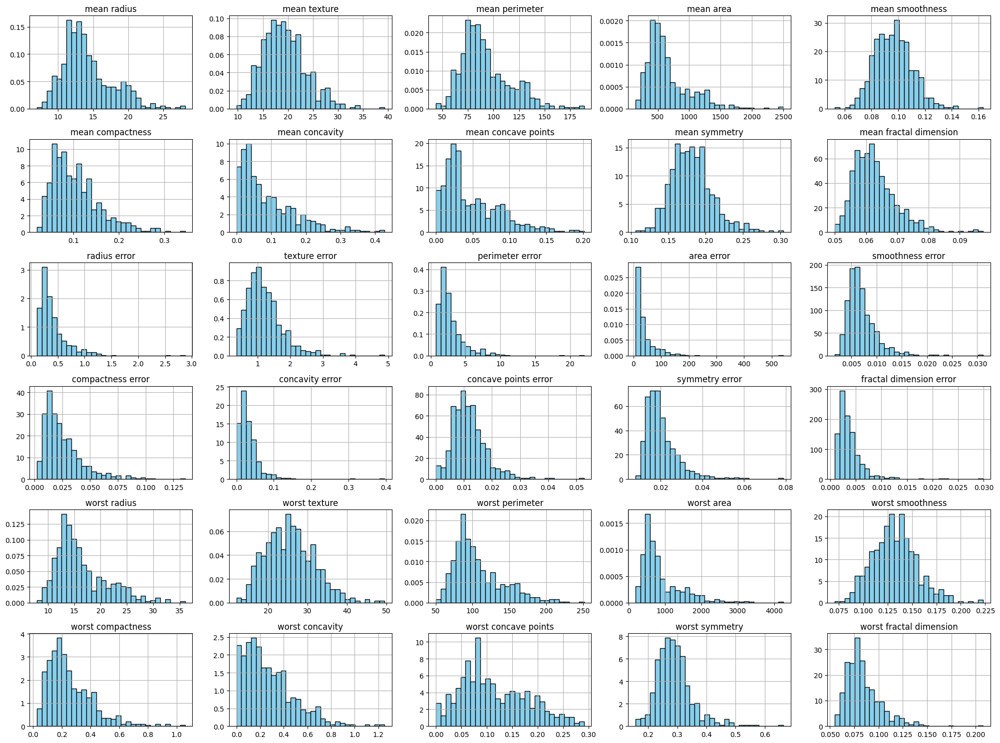

In [ ]:
caracteristicas = df.drop('target', axis=1)
caracteristicas.hist(bins=30, density=True, figsize=(20, 15), layout=(6, 5), color='skyblue', edgecolor='black')
plt.tight_layout()
plt.show()

- ¿Te resultan familiares estas distribuciones?


→ Observa el poder de la notación matricial, intenta entender qué tipo de objeto se genera en cada parte de las siguientes expresiones

In [ ]:
print("%.3f"%np.mean(df['mean radius'] ), "%.3f"%np.std(df['mean radius'] ))
print("%.3f"%np.mean(df['mean radius'] >15))

14.127 3.521
0.304


En promedio, la longitud del radio de las células (una característica importante para diferenciar entre tumores malignos y benignos) es de aproximadamente 14.127 unidades, con una variabilidad de 3.524 unidades alrededor de este valor. además, el 30% de las muestras en el conjunto de datos tienen un 'mean radius' mayor a 15 unidades.

Vamos a analizar dos caracteristicas

In [ ]:
feature_1 = 'mean radius'
feature_2 = 'mean texture'

print(df[df[feature_1] < 15][feature_2].values)
print(df[df[feature_1] < 15][feature_1].values)

[20.38 15.7  20.83 21.82 24.04 22.61 27.54 20.13 14.36 15.71 12.44 21.53
 18.7  21.72 18.42 25.2  20.82 21.58 21.35 20.28 21.81 16.84 18.66 14.63
 22.3  21.6  16.34 18.24 18.75 21.59 19.31 11.79 14.88 20.98 22.15 13.86
 23.84 23.94 21.01 19.04 17.33 16.49 14.64 15.79 16.52 10.94 18.   20.97
 15.86 15.65 21.46 21.8  15.24 24.02 14.76 18.3  17.84 19.94 12.84 19.77
 24.98 13.43 20.52 19.4  19.29 15.56 18.33 18.54 21.26 16.99 20.76 19.65
 20.19 15.83 21.53 15.76 16.67 10.82 10.89 16.39 17.21 24.69 13.29 22.47
 16.67 15.39 17.57 13.39 11.97 17.31 15.92 14.97 14.65 16.58 18.77 15.18
 17.91 20.78 20.7  15.34 13.08 15.34 17.94 12.74 12.96 20.18 22.22 19.76
  9.71 16.95 12.39 19.63 14.71 15.15 14.45 18.06 22.22 13.06 14.92 15.11
 17.19 17.39 15.9  23.12 21.41 18.22 26.86 23.21 16.33 22.29 20.22 19.56
 23.75 18.6  17.27 22.54 18.94 23.81 16.93 18.35 17.48 13.16 13.9  17.53
 17.02 13.47 15.46 23.97 22.33 27.08 33.81 15.91 21.25 27.85 15.6  15.04
 18.19 23.77 19.86 17.43 14.11 25.22 14.93 18.45 17

¿están correlacionadas?

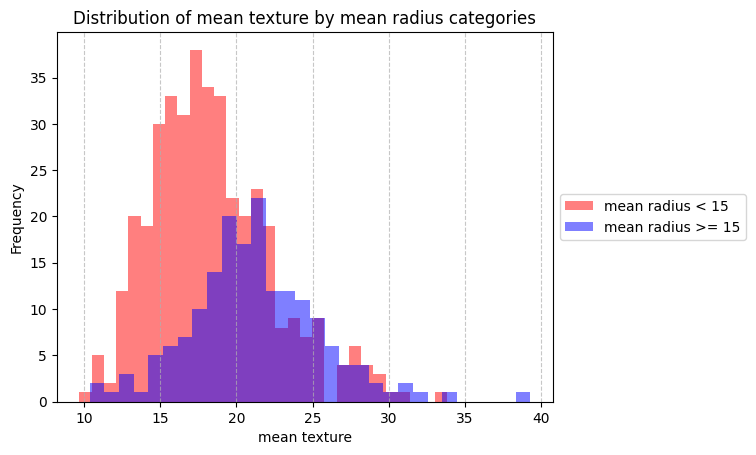

In [ ]:
plt.hist(df[df['mean radius'] < 15]['mean texture'].values, bins=30, color="red", alpha=0.5, label="mean radius < 15")
plt.hist(df[df['mean radius'] >= 15]['mean texture'].values, bins=30, color="blue", alpha=0.5, label="mean radius >= 15")
plt.legend(loc="center left", bbox_to_anchor=(1, 0.5))
plt.xlabel("mean texture")
plt.ylabel("Frequency")
plt.title("Distribution of mean texture by mean radius categories")
plt.grid(axis='x', linestyle='--', alpha=0.7)
plt.show()

Se muestra la distribución de mean texture para dos grupos basados en el valor de mean radius. Esto te permite ver si existe una diferencia en la distribución de mean texture cuando mean radius es bajo o alto.

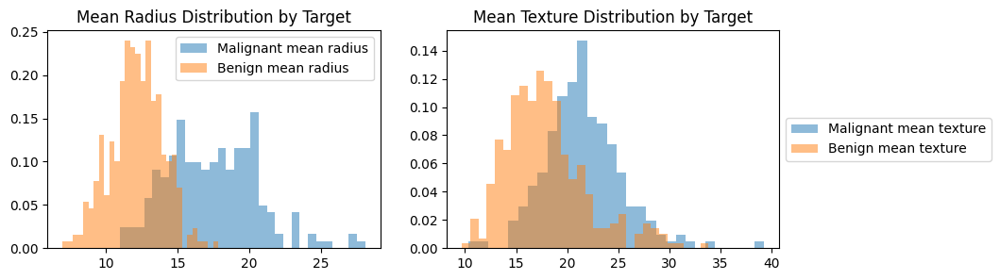

In [ ]:
plt.figure(figsize=(10, 3))

# Distribución de 'mean radius' por clase (benigno o maligno)
plt.subplot(121)
for target in df['target'].unique():
    subset = df[df['target'] == target]
    label = "Benign" if target == 1 else "Malignant"
    plt.hist(subset['mean radius'].values, bins=30, density=True, alpha=0.5, label=f"{label} mean radius")
plt.title("Mean Radius Distribution by Target")
plt.legend()

# Distribución de 'mean texture' por clase (benigno o maligno)
plt.subplot(122)
for target in df['target'].unique():
    subset = df[df['target'] == target]
    label = "Benign" if target == 1 else "Malignant"
    plt.hist(subset['mean texture'].values, bins=30, density=True, alpha=0.5, label=f"{label} mean texture")
plt.title("Mean Texture Distribution by Target")
plt.legend(loc="center left", bbox_to_anchor=(1, 0.5))

plt.show()

🗯 Se sugiere que tanto mean radius como mean texture pueden ayudar a diferenciar entre tumores benignos y malignos, ya que los tumores malignos tienden a tener valores más altos en ambas características. Sin embargo, también hay cierta superposición, lo que significa que estas características por sí solas no separan completamente las dos clases, pero pueden ser útiles en combinación con otras características para mejorar la clasificación.

Podemos ver las correlaciones de una manera más global

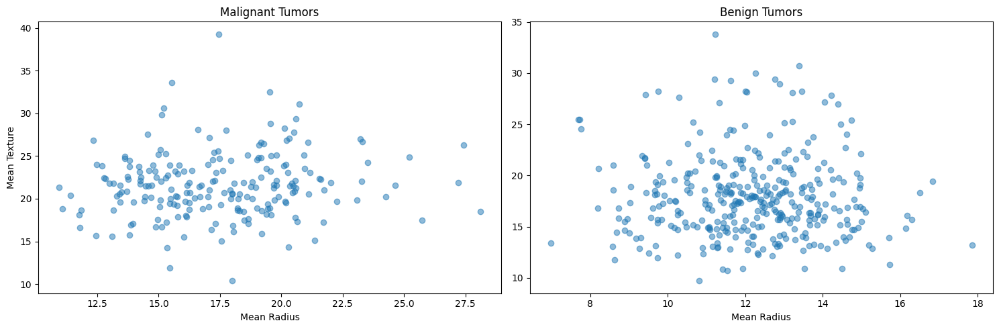

In [ ]:
plt.figure(figsize=(15, 5))

# Iterar por clase de tumor (0 = maligno, 1 = benigno)
for i, target in enumerate(df['target'].unique()):
    plt.subplot(1, 2, i + 1)  # 1 row, 2 columns, ith subplot
    subset = df[df['target'] == target]
    label = "Benign" if target == 1 else "Malignant"
    plt.scatter(subset['mean radius'], subset['mean texture'], alpha=0.5)
    plt.title(f"{label} Tumors")
    plt.xlabel("Mean Radius")
    if i == 0:  # Agregar etiqueta del eje y solo en el primer subplot
        plt.ylabel("Mean Texture")

plt.tight_layout()
plt.show()

<img src="https://github.com/ProgramandoSinBarreras/MachineLearningCourse/blob/main/Imagenes/03_Estadistica/Correlation_examples.png?raw=true" style="width:500px;">

 Esto indica que estas dos características no están correlacionadas de manera significativa en este dataset, ni para tumores benignos ni para malignos.



## **Correlación de Pearson**

- El coeficiente de correlación de Pearson (r) es una estadística que mide la relación lineal entre dos variables.

  $$ r = \frac{\sum (x_i - \bar{x})(y_i - \bar{y})}{\sqrt{\sum (x_i - \bar{x})^2 \sum (y_i - \bar{y})^2}}, $$

  donde:
 * $x_i$ y $y_i$ son los valores individuales de las variables $X$ e $Y$.
 * $\bar{x}$ y $\bar{y}$ son las medias de las variables $X$ e $Y$.

- r cerca de +1: A medida que una variable aumenta, la otra tiende a aumentar también. Esto indica una **fuerte relación lineal positiva**.
  
- r cerca de -1: A medida que una variable aumenta, la otra tiende a disminuir. Esto indica una **fuerte relación lineal negativa**.
  
- r cerca de 0: Existe poca o ninguna relación lineal entre las variables.


### **¿Qué es un P-Value?**

El valor P es la probabilidad de observar resultados al menos tan extremos como los observados, bajo la suposición de que la hipótesis nula es verdadera. En términos más simples, mide qué tan compatibles son tus datos con la hipótesis nula. La hipótesis nula típicamente representa una suposición básica o la ausencia de un efecto (por ejemplo, "no hay relación entre estas dos variables").


- Valor P Bajo (< 0.05): Un umbral común para la significancia es 0.05. Un valor P menor que 0.05 suele llevar a los investigadores a rechazar la hipótesis nula, concluyendo que los datos observados son poco probables bajo la hipótesis nula. Esto sugiere que hay evidencia a favor de la hipótesis alternativa, indicando la presencia de un efecto o una relación.

- Valor P Alto (≥ 0.05): Un valor P alto sugiere que los datos observados son consistentes con la hipótesis nula. En este caso, no hay suficiente evidencia para rechazar la hipótesis nula, y se concluye que no se observan efectos significativos.


In [ ]:
from scipy.stats import pearsonr

# Coeficiente de correlación de Pearson y el P_value entre mean radius y mean texture
correlation_coefficient, p_value = pearsonr(df['mean radius'], df['mean texture'])

print("Pearson Correlation Coefficient:", correlation_coefficient)
print("P-value:", p_value)


Pearson Correlation Coefficient: 0.3237818909277329
P-value: 2.360374375923924e-15


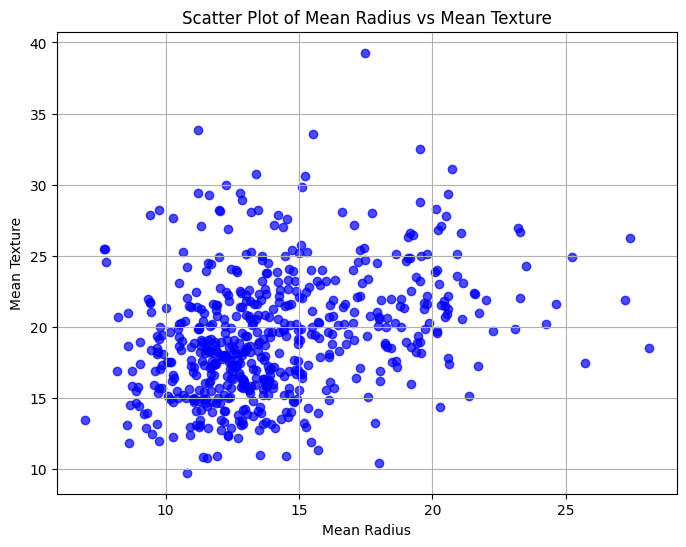

In [ ]:
plt.figure(figsize=(8, 6))
plt.scatter(df['mean radius'], df['mean texture'], color='blue', alpha=0.7)
plt.title('Scatter Plot of Mean Radius vs Mean Texture')
plt.xlabel('Mean Radius')
plt.ylabel('Mean Texture')
plt.grid(True)
plt.show()


En este caso, aunque la correlación es estadísticamente significativa, la relación entre mean radius y mean texture no es fuerte y probablemente no sea útil para fines predictivos o interpretativos, ya que la correlación es muy baja.


In [ ]:
correlation_coefficient, p_value = pearsonr(df['mean perimeter'], df['mean area'])

print("Pearson Correlation Coefficient:", correlation_coefficient)
print("P-value:", p_value)

Pearson Correlation Coefficient: 0.9865068039913902
P-value: 0.0


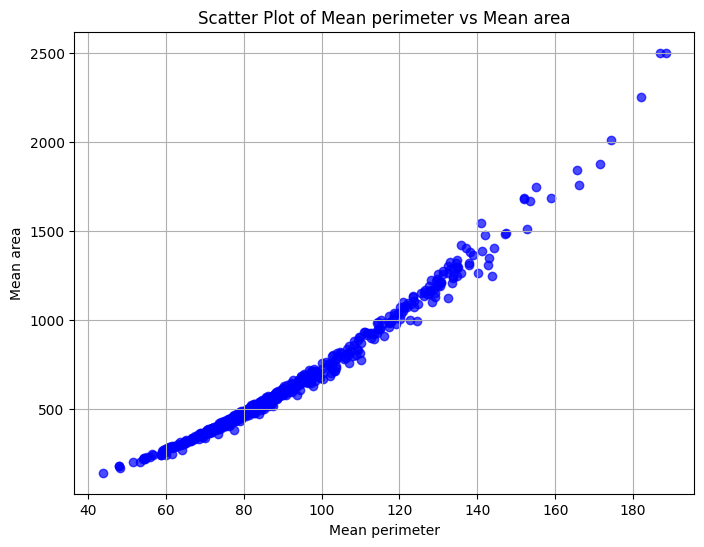

In [ ]:
plt.figure(figsize=(8, 6))
plt.scatter(df['mean perimeter'], df['mean area'], color='blue', alpha=0.7)
plt.title('Scatter Plot of Mean perimeter vs Mean area')
plt.xlabel('Mean perimeter')
plt.ylabel('Mean area')
plt.grid(True)
plt.show()

mean perimeter y mean area son dos características que están fuertemente correlacionadas con un coeficiente de correlación de Pearson de 0.98

# Multicolinealidad

La multicolinealidad es un fenómeno en el análisis de regresión donde las variables independientes (predictoras) exhiben fuertes relaciones lineales entre sí. Esta condición socava el supuesto estadístico de independencia de los predictores, complicando la interpretación de los coeficientes del modelo. Cuando la multicolinealidad está presente, se vuelve difícil aislar el efecto de un solo predictor sobre la variable dependiente porque los cambios en un predictor están estrechamente ligados a los cambios en otro.

- En el contexto del análisis del Dataset Iris, una tarea común podría involucrar la construcción de un modelo de regresión para predecir la longitud del sépalo (sepal_length) de una flor de Iris basándose en otros atributos como el ancho del sépalo (sepal_width), la longitud del pétalo (petal_length) y el ancho del pétalo (petal_width).

###  Factor de Inflación de la Varianza (VIF)

El Factor de Inflación de la Varianza (VIF) es una medida utilizada para detectar la presencia y severidad de la multicolinealidad en el análisis de regresión. Cuantifica cuánto aumenta la varianza de un coeficiente de regresión estimado si los predictores están correlacionados. A continuación, se presenta una interpretación general de los valores de VIF en diferentes rangos:

* VIF = 1: Indica que el predictor no está correlacionado con ninguna otra variable independiente en el modelo.

* 1 < VIF < 5: Sugiere una correlación moderada con otros predictores, pero no lo suficientemente severa como para justificar preocupaciones serias sobre la multicolinealidad.

* VIF ≈ 5: A menudo se considera un umbral, indicando un nivel problemático de correlación con otras variables independientes que podría influir en las estimaciones de los coeficientes.

* VIF > 5: Sugiere que hay una multicolinealidad sustancial que puede distorsionar los coeficientes de regresión y hacer que sean poco fiables.

* VIF ≥ 10: Se utiliza comúnmente como un umbral más conservador que indica una multicolinealidad muy alta. Implica que la varianza de un coeficiente de regresión está inflada por un factor de al menos 10 debido a la multicolinealidad con otros predictores.



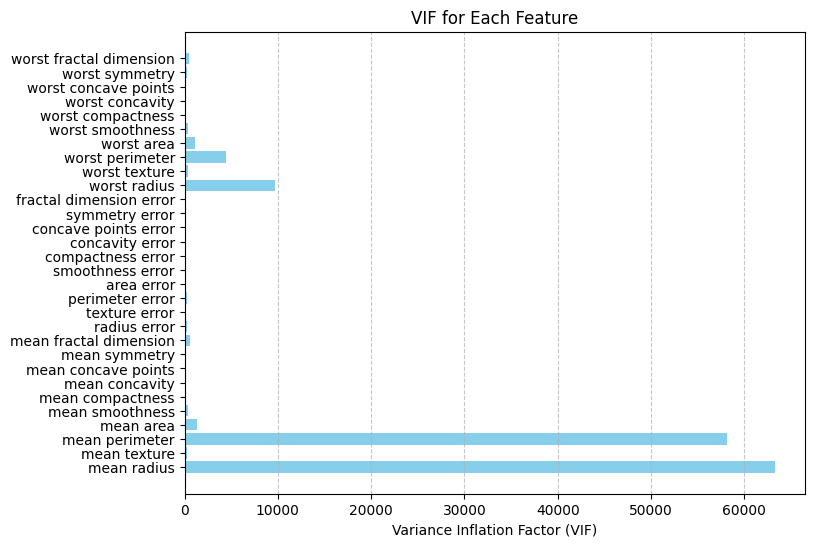

,feature,VIF
0,mean radius,63306.172036
1,mean texture,251.047108
2,mean perimeter,58123.586079
3,mean area,1287.262339
4,mean smoothness,393.398166
5,mean compactness,200.980354
6,mean concavity,157.855046
7,mean concave points,154.241268
8,mean symmetry,184.426558
9,mean fractal dimension,629.679874


In [ ]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

# Variables predictoras
X = df.drop(columns=['target'])  # Eliminamos la variable objetivo 'target'

# Calcular VIF para cada característica
vif_data = pd.DataFrame()
vif_data["feature"] = X.columns
vif_data["VIF"] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]

# Visualización de VIF
plt.figure(figsize=(8, 6))
plt.barh(vif_data['feature'], vif_data['VIF'], color='skyblue')
plt.xlabel('Variance Inflation Factor (VIF)')
plt.title('VIF for Each Feature')
plt.grid(axis='x', linestyle='--', alpha=0.7)
plt.show()

vif_data

Este análisis indica que varias características en el dataset están fuertemente correlacionadas y podrían estar aportando información redundante.



Veamos la relación de otra manera

In [ ]:
sns.pairplot(X, kind='reg')
plt.suptitle("Pairplot with Linear Regression", y=1.02)
plt.show()

# Feature Ratio Analysis

El Análisis de Ratios de Características (FRA) implica la creación de nuevas características basadas en las proporciones de características existentes, con el objetivo de descubrir relaciones que no son inmediatamente aparentes al observar las características de forma individual. Esta técnica puede ser particularmente útil en dominios donde la interacción entre características numéricas podría proporcionar información o poder predictivo más allá de las características individuales.



In [ ]:
df_2 = df.copy()
df_2['mean_radius_to_texture_ratio'] = df_2['mean radius'] / df_2['mean texture']

# Mostrar las primeras filas para verificar la nueva característica
print(df_2[['mean radius', 'mean texture', 'mean_radius_to_texture_ratio']].head(5))

   mean radius  mean texture  mean_radius_to_texture_ratio
0        17.99         10.38                      1.733141
1        20.57         17.77                      1.157569
2        19.69         21.25                      0.926588
3        11.42         20.38                      0.560353
4        20.29         14.34                      1.414923


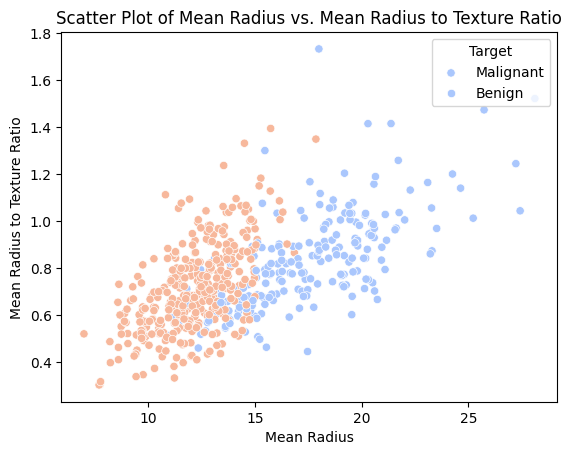

In [ ]:
import seaborn as sns

sns.scatterplot(data=df_2, x='mean radius', y='mean_radius_to_texture_ratio', hue='target', palette='coolwarm')

plt.title('Scatter Plot of Mean Radius vs. Mean Radius to Texture Ratio')
plt.xlabel('Mean Radius')
plt.ylabel('Mean Radius to Texture Ratio')
plt.legend(title='Target', labels=['Malignant', 'Benign'], loc='upper right')
plt.show()

Se sugiere que la relación entre Mean Radius y Mean Texture (a través del FRA) junto con Mean Radius como variable en el eje x, ayuda a capturar una diferenciación entre tumores benignos y malignos. Esto indica que el Feature Ratio Analysis puede ser una técnica valiosa para crear características derivadas que aporten más información en modelos de clasificación.

# Recursive Feature Elimination

La Eliminación Recursiva de Características (RFE) es una técnica de selección de características utilizada en el aprendizaje automático para seleccionar automáticamente un subconjunto de características del conjunto de datos original. El objetivo principal de RFE es identificar las características más relevantes que contribuyen de manera significativa a la predicción de la variable objetivo, mientras se eliminan las características irrelevantes o redundantes.

Beneficios:

* Selección Automática de Características: RFE automatiza el proceso de selección de características, reduciendo la necesidad de realizar pruebas y errores manualmente.

* Mejora el Rendimiento del Modelo: Al seleccionar solo las características más relevantes, RFE puede mejorar el rendimiento de los modelos de aprendizaje automático, aumentando la precisión de las predicciones y reduciendo el sobreajuste.

* Maneja la Multicolinealidad: RFE puede manejar problemas de multicolinealidad seleccionando características basadas en su importancia individual en lugar de su correlación con otras características.

* Mejora la Interpretabilidad del Modelo: Un conjunto reducido de características seleccionadas por RFE puede hacer que el modelo sea más interpretable y más fácil de entender.

Primeras 10 filas del dataset:
   mean radius  mean texture  mean perimeter  mean area  mean smoothness  \
0        17.99         10.38          122.80     1001.0          0.11840   
1        20.57         17.77          132.90     1326.0          0.08474   
2        19.69         21.25          130.00     1203.0          0.10960   
3        11.42         20.38           77.58      386.1          0.14250   
4        20.29         14.34          135.10     1297.0          0.10030   
5        12.45         15.70           82.57      477.1          0.12780   
6        18.25         19.98          119.60     1040.0          0.09463   
7        13.71         20.83           90.20      577.9          0.11890   
8        13.00         21.82           87.50      519.8          0.12730   
9        12.46         24.04           83.97      475.9          0.11860   

   mean compactness  mean concavity  mean concave points  mean symmetry  \
0           0.27760         0.30010              0.14710 

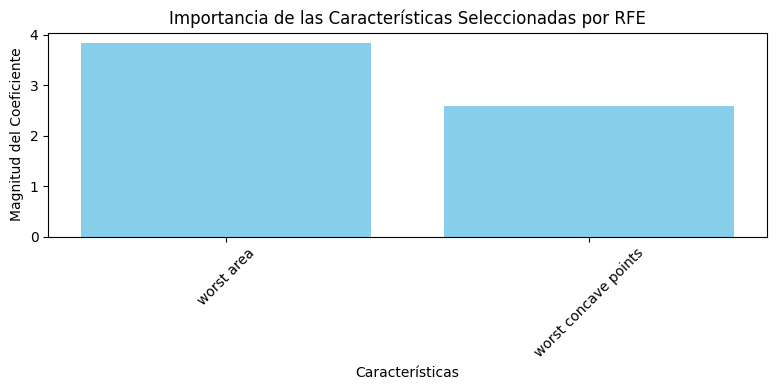

In [ ]:
from sklearn.datasets import load_breast_cancer
from sklearn.linear_model import LogisticRegression
from sklearn.feature_selection import RFE
from sklearn.preprocessing import StandardScaler

# Cargar el dataset Breast Cancer Wisconsin (Diagnostic)
data = load_breast_cancer()
X = data.data
y = data.target

# Crear un DataFrame para facilitar el manejo de datos
df = pd.DataFrame(X, columns=data.feature_names)
df['target'] = y

# Mostrar las primeras 10 filas del DataFrame
print("Primeras 10 filas del dataset:")
print(df.head(10))

# Inicializar el StandardScaler
scaler = StandardScaler()

# Estandarizar las características (excluyendo la variable objetivo)
X_scaled = scaler.fit_transform(df.drop('target', axis=1))

# Inicializar el modelo de Regresión Logística
estimator = LogisticRegression(max_iter=500, random_state=42)

# Inicializar RFE para seleccionar 2 características
n_features_to_select = 2
rfe = RFE(estimator, n_features_to_select=n_features_to_select)

# Ajustar RFE a los datos estandarizados
rfe.fit(X_scaled, y)

# Obtener el ranking de las características
ranking = rfe.ranking_

# Obtener la máscara de las características seleccionadas
selected_mask = rfe.support_

# Obtener los nombres de las características
feature_names = np.array(data.feature_names)

# Obtener los nombres de las características seleccionadas
selected_features = feature_names[selected_mask]

# Para clasificación binaria, obtener la magnitud absoluta de los coeficientes
feature_importances = np.abs(rfe.estimator_.coef_[0])

# Mostrar las características seleccionadas
print("\nCaracterísticas seleccionadas por RFE:")
print(selected_features)

# Crear el gráfico de barras para las características seleccionadas
plt.figure(figsize=(8, 4))
plt.bar(range(len(selected_features)), feature_importances, color='skyblue', align='center')
plt.xticks(range(len(selected_features)), selected_features, rotation=45)
plt.xlabel('Características')
plt.ylabel('Magnitud del Coeficiente')
plt.title('Importancia de las Características Seleccionadas por RFE')
plt.tight_layout()
plt.show()


Se sugiere que worst area y worst concave points son las características más significativas para el modelo de clasificación, lo cual es consistente con el análisis de datos biomédicos, donde los tumores de mayor tamaño y contornos irregulares tienden a ser malignos.

# Boosting

Esta es una técnica donde utilizas algoritmos de boosting para determinar la importancia de cada característica en tu conjunto de datos. Boosting es un tipo de aprendizaje de conjunto (ensemble learning) donde los modelos se construyen de manera secuencial, y cada nuevo modelo se enfoca en los errores del anterior, mejorando la precisión paso a paso. Las características utilizadas por estos modelos para realizar predicciones precisas a menudo se consideran importantes, mientras que las características que se utilizan menos pueden considerarse menos relevantes.

Interpretación general de las puntuaciones:

* Puntuaciones de Importancia Elevadas: Las características con puntuaciones más altas son consideradas por el modelo como aquellas que tienen un mayor impacto en la predicción. Un cambio en los valores de estas características probablemente tendrá un efecto significativo en la salida del modelo. En muchos casos, esto significa que la característica es eficaz para ayudar al modelo a distinguir entre las diferentes clases objetivo o para predecir con precisión una variable objetivo continua.

* Puntuaciones de Importancia Bajas: Las características con puntuaciones más bajas son consideradas por el modelo como aquellas que tienen menos influencia en el resultado de la predicción. Los cambios en estas características pueden tener un efecto menor en el rendimiento del modelo. A veces, tales características podrían ser candidatas para su eliminación durante la selección de variables para reducir la complejidad del modelo y el posible sobreajuste.

* Puntuaciones Cero o Casi Cero: Una característica con una puntuación de importancia cero o casi cero es vista por el modelo como aquella que no tiene un efecto discernible en las predicciones. Estas características a menudo se eliminan del modelo para mejorar la eficiencia y enfocarse en características más significativas.

/usr/local/lib/python3.10/dist-packages/xgboost/core.py:158: UserWarning: [00:47:29] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


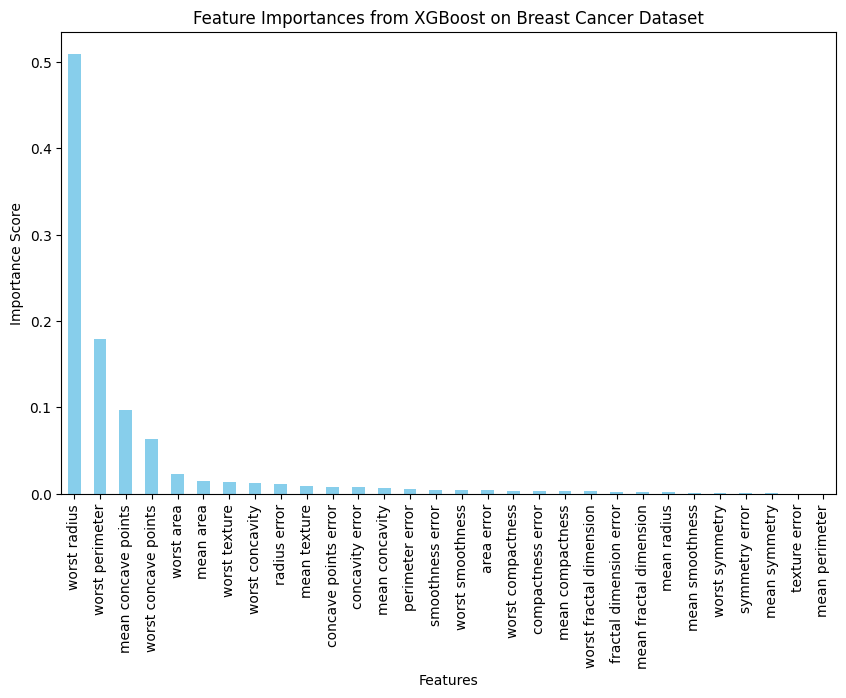

In [ ]:
import xgboost as xgb

# Definir variables predictoras (X) y objetivo (y)
X = df.drop(columns=['target'])
y = df['target']

# Inicializar el clasificador XGBoost
model = xgb.XGBClassifier(use_label_encoder=False, eval_metric='mlogloss')

# Ajustar el modelo
model.fit(X, y)

# Obtener importancias de las características
feature_importances = model.feature_importances_

# Crear una serie de pandas con las importancias de las características
importance_series = pd.Series(feature_importances, index=X.columns)

# Ordenar las características por su importancia
sorted_importance = importance_series.sort_values(ascending=False)

# Gráfico de importancias de características
plt.figure(figsize=(10, 6))
sorted_importance.plot(kind='bar', color='skyblue')
plt.title('Feature Importances from XGBoost on Breast Cancer Dataset')
plt.ylabel('Importance Score')
plt.xlabel('Features')
plt.show()

El modelo de XGBoost ha identificado un pequeño grupo de características como las más relevantes para predecir si un tumor es maligno o benigno. worst radius es, con diferencia, la característica más influyente, seguida por otras medidas de "peor caso" del tamaño y forma del tumor.

# Regresión lineal

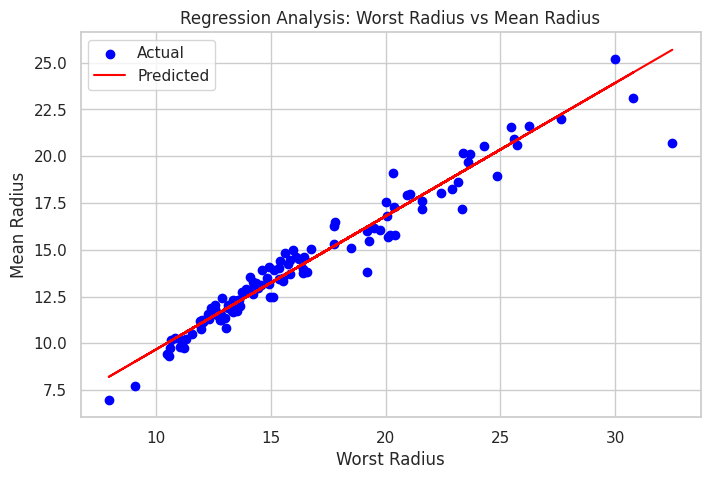


Resultados para Worst Radius como predictor de Mean Radius:
R^2 Score: 0.94
RMSE (Root Mean Squared Error): 0.83
MSE (Mean Squared Error): 0.69
MAE (Mean Absolute Error): 0.57
------------------------------------------------


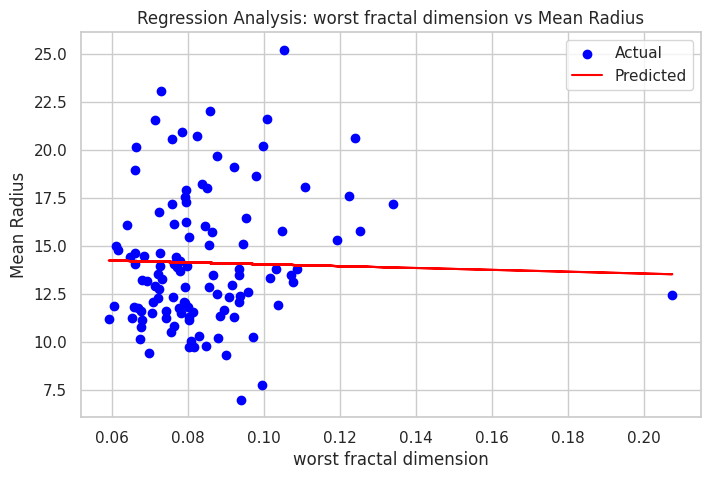


Resultados para worst fractal dimension como predictor de Mean Radius:
R^2 Score: -0.01
RMSE (Root Mean Squared Error): 3.49
MSE (Mean Squared Error): 12.18
MAE (Mean Absolute Error): 2.75
------------------------------------------------


In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error
import pandas as pd


# Seleccionar la característica más importante y la menos importante
# Característica más importante: "worst radius"
# Característica menos importante: "fractal dimension se"
X_most_important = df[['worst radius']].values
X_least_important = df[['worst fractal dimension']].values
y = df['mean radius'].values  # Usamos "mean radius" como variable objetivo

# Función para entrenar y evaluar un modelo de regresión lineal
def regression_analysis(X, y, feature_name):
    # Dividir los datos en entrenamiento y prueba
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

    # Crear y entrenar el modelo de regresión lineal
    model = LinearRegression()
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)

    # Graficar los resultados
    plt.figure(figsize=(8, 5))
    plt.scatter(X_test, y_test, color='blue', label='Actual')
    plt.plot(X_test, y_pred, color='red', label='Predicted')
    plt.title(f'Regression Analysis: {feature_name} vs Mean Radius')
    plt.xlabel(feature_name)
    plt.ylabel('Mean Radius')
    plt.legend()
    plt.show()

    # Calcular y mostrar las métricas de rendimiento
    r2 = r2_score(y_test, y_pred)
    rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    mse = mean_squared_error(y_test, y_pred)
    mae = mean_absolute_error(y_test, y_pred)

    print(f"\nResultados para {feature_name} como predictor de Mean Radius:")
    print(f"R^2 Score: {r2:.2f}")
    print(f"RMSE (Root Mean Squared Error): {rmse:.2f}")
    print(f"MSE (Mean Squared Error): {mse:.2f}")
    print(f"MAE (Mean Absolute Error): {mae:.2f}")
    print("------------------------------------------------")

# Análisis de regresión usando la característica más importante
regression_analysis(X_most_important, y, 'Worst Radius')

# Análisis de regresión usando la característica menos importante
regression_analysis(X_least_important, y, 'worst fractal dimension')


Estos resultados muestran que worst fractal dimension es un predictor pobre para mean radius, lo cual se refleja en la baja (incluso negativa) capacidad predictiva del modelo y en los altos errores (RMSE, MSE y MAE). Comparado con worst radius, esta característica aporta poco valor para predecir mean radius. Esto refuerza nuestras conclusiones previas: worst fractal dimension es una característica de baja relevancia en este contexto, mientras que worst radius es mucho más importante y efectiva como predictor.

<ipython-input-54-bdf837bd20a9>:41: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "g-" (-> color='g'). The keyword argument will take precedence.
  plt.plot(y_test, errores, 'g-', label='Errores Residuales', color='green')


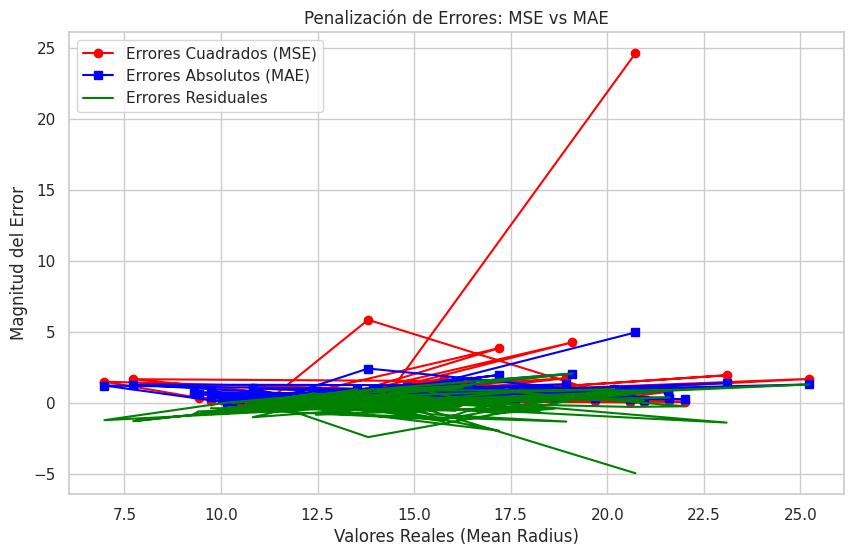

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, mean_absolute_error


# Seleccionar la característica más importante ("worst radius") y la variable objetivo ("mean radius")
X = df[['worst radius']].values
y = df['mean radius'].values

# Dividir los datos en entrenamiento y prueba
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Crear y entrenar el modelo de regresión lineal
model = LinearRegression()
model.fit(X_train, y_train)
y_pred = model.predict(X_test)

# Calcular los errores residuales
errores = y_test - y_pred

# Calcular los errores al cuadrado y los errores absolutos
errores_cuadrados = errores ** 2
errores_absolutos = np.abs(errores)

# Preparamos la gráfica
plt.figure(figsize=(10, 6))

# Dibujamos los errores al cuadrado (MSE)
plt.plot(y_test, errores_cuadrados, 'o-', label='Errores Cuadrados (MSE)', color='red')

# Dibujamos los errores absolutos (MAE)
plt.plot(y_test, errores_absolutos, 's-', label='Errores Absolutos (MAE)', color='blue')

# Dibujamos los errores residuales
plt.plot(y_test, errores, 'g-', label='Errores Residuales', color='green')

plt.title('Penalización de Errores: MSE vs MAE')
plt.xlabel('Valores Reales (Mean Radius)')
plt.ylabel('Magnitud del Error')
plt.legend()
plt.grid(True)

plt.show()


* Sensibilidad a los Errores Extremos: El MSE es más sensible a los errores grandes, lo cual se observa en los picos rojos. Esto puede ser útil cuando se desea penalizar fuertemente los errores significativos, pero también puede hacer que el modelo sea más sensible a los outliers.

* Estabilidad del MAE: El MAE (en azul) es más estable y menos afectado por los errores grandes, lo cual lo hace adecuado para situaciones donde se busca una penalización más uniforme.

* Oscilación de los Errores Residuales: La dispersión de los errores residuales en verde alrededor de cero indica la tendencia del modelo a subestimar o sobrestimar sin sesgo claro.

# References

[1] statistic in plain english (book)

[2] Reference scipy: https://docs.scipy.org/doc/scipy/reference/index.html

[3] Some distributions in scipy: http://cmdlinetips.com/2018/03/probability-distributions-in-python/

[4] Statistical distributions: a summary: http://people.stern.nyu.edu/adamodar/New_Home_Page/StatFile/statdistns.htm

[5] Probability concepts explained: Introduction: https://towardsdatascience.com/probability-concepts-explained-introduction-a7c0316de465


<img src="https://github.com/ProgramandoSinBarreras/MachineLearningCourse/blob/main/Imagenes/01_introduccion_python/programando_sin_barreras.jpeg?raw=true" alt="Drawing" style="width:1000px;">

